# Comparing Word Usage Between books of the Bible and different versions
#### By Bryce Nesius

In [1]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import re
from plotly.subplots import make_subplots

In [2]:
from wordcloud import WordCloud, STOPWORDS

# Questions

 - #### What are some of the most used words in each book?
 - #### What words are used the most frequently throughout the bible?
 - #### What are the most used feelings in the Bible? (happy, sad, angry, upset, tired, sorrow, etc)
 
 

In [3]:
kjv_raw = pd.read_csv("kjv.csv", header=[2], index_col=1)
asv_raw = pd.read_csv("asv.csv", header=[2], index_col=1)
asv_raw

,Verse ID,Book Number,Chapter,Verse,Text
Book Name,,,,,
Genesis,1,1,1,1,In the beginning God created the heavens and t...
Genesis,2,1,1,2,And the earth was waste and void; and darkness...
Genesis,3,1,1,3,"And God said, Let there be light: and there wa..."
Genesis,4,1,1,4,"And God saw the light, that it was good: and G..."
Genesis,5,1,1,5,"And God called the light Day, and the darkness..."
...,...,...,...,...,...
Revelation,31098,66,22,17,"And the Spirit and the bride say, Come. And he..."
Revelation,31099,66,22,18,I testify unto every man that heareth the word...
Revelation,31100,66,22,19,and if any man shall take away from the words ...


In [4]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth',2000)
asv_raw.head(10)

,Verse ID,Book Number,Chapter,Verse,Text
Book Name,,,,,
Genesis,1,1,1,1,In the beginning God created the heavens and the earth.
Genesis,2,1,1,2,And the earth was waste and void; and darkness was upon the face of the deep: and the Spirit of God moved upon the face of the waters.
Genesis,3,1,1,3,"And God said, Let there be light: and there was light."
Genesis,4,1,1,4,"And God saw the light, that it was good: and God divided the light from the darkness."
Genesis,5,1,1,5,"And God called the light Day, and the darkness he called Night. And there was evening and there was morning, one day."
Genesis,6,1,1,6,"And God said, Let there be a firmament in the midst of the waters, and let it divide the waters from the waters."
Genesis,7,1,1,7,"And God made the firmament, and divided the waters which were under the firmament from the waters which were above the firmament: and it was so."
Genesis,8,1,1,8,"And God called the firmament Heaven. And there was evening and there was morning, a second day."
Genesis,9,1,1,9,"And God said, Let the waters under the heavens be gathered together unto one place, and let the dry land appear: and it was so."


## Clean up the data
I first recognized that the data was sort of organized, but not quite how I wanted it, so in order to for example, to combine the chapter and verse number columns I first had to convert the whole column to be a string object rather an integer. 

In [5]:
asv_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31102 entries, Genesis to Revelation
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Verse ID     31102 non-null  int64 
 1   Book Number  31102 non-null  int64 
 2   Chapter      31102 non-null  int64 
 3   Verse        31102 non-null  int64 
 4   Text         31101 non-null  object
dtypes: int64(4), object(1)
memory usage: 1.4+ MB


Here we'll check to verify the conversion to strings worked, and it did as you can see that Verse and Chapter are now object data types. The next step will be to concatenate them together into one column. So in this case I've chosen to put the combined version in the "Verse" column and then we'll just discard the chapter column.

In [6]:
asv_raw["Chapter"] = asv_raw["Chapter"].apply(str)
asv_raw["Verse"] = asv_raw["Verse"].apply(str)
asv_raw["Chapter"].str[:80]
asv_raw["Verse"].str[:80]

asv_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31102 entries, Genesis to Revelation
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Verse ID     31102 non-null  int64 
 1   Book Number  31102 non-null  int64 
 2   Chapter      31102 non-null  object
 3   Verse        31102 non-null  object
 4   Text         31101 non-null  object
dtypes: int64(2), object(3)
memory usage: 1.4+ MB


In [7]:
kjv_raw["Chapter"] = kjv_raw["Chapter"].apply(str)
kjv_raw["Verse"] = kjv_raw["Verse"].apply(str)
kjv_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31102 entries, Genesis to Revelation
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Verse ID     31102 non-null  int64 
 1   Book Number  31102 non-null  int64 
 2   Chapter      31102 non-null  object
 3   Verse        31102 non-null  object
 4   Text         31102 non-null  object
dtypes: int64(2), object(3)
memory usage: 1.4+ MB


In [8]:
asv_raw["Verse"] = asv_raw["Chapter"] + ":" + asv_raw["Verse"]
asv_raw

,Verse ID,Book Number,Chapter,Verse,Text
Book Name,,,,,
Genesis,1,1,1,1:1,In the beginning God created the heavens and the earth.
Genesis,2,1,1,1:2,And the earth was waste and void; and darkness was upon the face of the deep: and the Spirit of God moved upon the face of the waters.
Genesis,3,1,1,1:3,"And God said, Let there be light: and there was light."
Genesis,4,1,1,1:4,"And God saw the light, that it was good: and God divided the light from the darkness."
Genesis,5,1,1,1:5,"And God called the light Day, and the darkness he called Night. And there was evening and there was morning, one day."
...,...,...,...,...,...
Revelation,31098,66,22,22:17,"And the Spirit and the bride say, Come. And he that heareth, let him say, Come. And he that is athirst, let him come: he that will, let him take the water of life freely."
Revelation,31099,66,22,22:18,"I testify unto every man that heareth the words of the prophecy of this book, if any man shall add unto them, God shall add unto him the plagues which are written in this book:"
Revelation,31100,66,22,22:19,"and if any man shall take away from the words of the book of this prophecy, God shall take away his part from the tree of life, and out of the holy city, which are written in this book."


In [9]:
kjv_raw.head(10)

,Verse ID,Book Number,Chapter,Verse,Text
Book Name,,,,,
Genesis,1,1,1,1,¶ In the beginning God created the heaven and the earth.
Genesis,2,1,1,2,"And the earth was without form, and void; and darkness [was] upon the face of the deep. And the Spirit of God moved upon the face of the waters."
Genesis,3,1,1,3,"¶ And God said, Let there be light: and there was light."
Genesis,4,1,1,4,"And God saw the light, that [it was] good: and God divided the light from the darkness."
Genesis,5,1,1,5,"And God called the light Day, and the darkness he called Night. And the evening and the morning were the first day."
Genesis,6,1,1,6,"¶ And God said, Let there be a firmament in the midst of the waters, and let it divide the waters from the waters."
Genesis,7,1,1,7,"And God made the firmament, and divided the waters which [were] under the firmament from the waters which [were] above the firmament: and it was so."
Genesis,8,1,1,8,And God called the firmament Heaven. And the evening and the morning were the second day.
Genesis,9,1,1,9,"¶ And God said, Let the waters under the heaven be gathered together unto one place, and let the dry [land] appear: and it was so."


In [10]:
kjv_raw["Verse"] = kjv_raw["Chapter"] + ":" + kjv_raw["Verse"]
kjv_raw.head(10)

,Verse ID,Book Number,Chapter,Verse,Text
Book Name,,,,,
Genesis,1,1,1,1:1,¶ In the beginning God created the heaven and the earth.
Genesis,2,1,1,1:2,"And the earth was without form, and void; and darkness [was] upon the face of the deep. And the Spirit of God moved upon the face of the waters."
Genesis,3,1,1,1:3,"¶ And God said, Let there be light: and there was light."
Genesis,4,1,1,1:4,"And God saw the light, that [it was] good: and God divided the light from the darkness."
Genesis,5,1,1,1:5,"And God called the light Day, and the darkness he called Night. And the evening and the morning were the first day."
Genesis,6,1,1,1:6,"¶ And God said, Let there be a firmament in the midst of the waters, and let it divide the waters from the waters."
Genesis,7,1,1,1:7,"And God made the firmament, and divided the waters which [were] under the firmament from the waters which [were] above the firmament: and it was so."
Genesis,8,1,1,1:8,And God called the firmament Heaven. And the evening and the morning were the second day.
Genesis,9,1,1,1:9,"¶ And God said, Let the waters under the heaven be gathered together unto one place, and let the dry [land] appear: and it was so."


Here I'm going to delete any unnecessary information that clutters the dataFrame.

In [11]:
del asv_raw["Book Number"]
del asv_raw["Chapter"]
del asv_raw["Verse ID"]

asv_raw

,Verse,Text
Book Name,,
Genesis,1:1,In the beginning God created the heavens and the earth.
Genesis,1:2,And the earth was waste and void; and darkness was upon the face of the deep: and the Spirit of God moved upon the face of the waters.
Genesis,1:3,"And God said, Let there be light: and there was light."
Genesis,1:4,"And God saw the light, that it was good: and God divided the light from the darkness."
Genesis,1:5,"And God called the light Day, and the darkness he called Night. And there was evening and there was morning, one day."
...,...,...
Revelation,22:17,"And the Spirit and the bride say, Come. And he that heareth, let him say, Come. And he that is athirst, let him come: he that will, let him take the water of life freely."
Revelation,22:18,"I testify unto every man that heareth the words of the prophecy of this book, if any man shall add unto them, God shall add unto him the plagues which are written in this book:"
Revelation,22:19,"and if any man shall take away from the words of the book of this prophecy, God shall take away his part from the tree of life, and out of the holy city, which are written in this book."


In [12]:
del kjv_raw["Chapter"]
del kjv_raw["Book Number"]
del kjv_raw["Verse ID"]
kjv_raw

,Verse,Text
Book Name,,
Genesis,1:1,¶ In the beginning God created the heaven and the earth.
Genesis,1:2,"And the earth was without form, and void; and darkness [was] upon the face of the deep. And the Spirit of God moved upon the face of the waters."
Genesis,1:3,"¶ And God said, Let there be light: and there was light."
Genesis,1:4,"And God saw the light, that [it was] good: and God divided the light from the darkness."
Genesis,1:5,"And God called the light Day, and the darkness he called Night. And the evening and the morning were the first day."
...,...,...
Revelation,22:17,"And the Spirit and the bride say, Come. And let him that heareth say, Come. And let him that is athirst come. And whosoever will, let him take the water of life freely."
Revelation,22:18,"For I testify unto every man that heareth the words of the prophecy of this book, If any man shall add unto these things, God shall add unto him the plagues that are written in this book:"
Revelation,22:19,"And if any man shall take away from the words of the book of this prophecy, God shall take away his part out of the book of life, and out of the holy city, and [from] the things which are written in this book."


## Next we'll need to set indexes
In order to avoid loads of errors and confusion, we need to establish a new multiindex, so here we will set a new index of "Verse", so that we can further reference verses within books of the Bible. 

In [13]:
asv_raw.set_index( "Verse")

,Text
Verse,
1:1,In the beginning God created the heavens and the earth.
1:2,And the earth was waste and void; and darkness was upon the face of the deep: and the Spirit of God moved upon the face of the waters.
1:3,"And God said, Let there be light: and there was light."
1:4,"And God saw the light, that it was good: and God divided the light from the darkness."
1:5,"And God called the light Day, and the darkness he called Night. And there was evening and there was morning, one day."
...,...
22:17,"And the Spirit and the bride say, Come. And he that heareth, let him say, Come. And he that is athirst, let him come: he that will, let him take the water of life freely."
22:18,"I testify unto every man that heareth the words of the prophecy of this book, if any man shall add unto them, God shall add unto him the plagues which are written in this book:"
22:19,"and if any man shall take away from the words of the book of this prophecy, God shall take away his part from the tree of life, and out of the holy city, which are written in this book."


In [14]:
kjv_raw.set_index( "Verse")

,Text
Verse,
1:1,¶ In the beginning God created the heaven and the earth.
1:2,"And the earth was without form, and void; and darkness [was] upon the face of the deep. And the Spirit of God moved upon the face of the waters."
1:3,"¶ And God said, Let there be light: and there was light."
1:4,"And God saw the light, that [it was] good: and God divided the light from the darkness."
1:5,"And God called the light Day, and the darkness he called Night. And the evening and the morning were the first day."
...,...
22:17,"And the Spirit and the bride say, Come. And let him that heareth say, Come. And let him that is athirst come. And whosoever will, let him take the water of life freely."
22:18,"For I testify unto every man that heareth the words of the prophecy of this book, If any man shall add unto these things, God shall add unto him the plagues that are written in this book:"
22:19,"And if any man shall take away from the words of the book of this prophecy, God shall take away his part out of the book of life, and out of the holy city, and [from] the things which are written in this book."


### Make dataFrames for each book, here we start off with 6 from the American Standard Version
## ASV

In [15]:
asv_matt = asv_raw.loc["Matthew"]
asv_mark = asv_raw.loc["Mark"]
asv_luke = asv_raw.loc["Luke"]
asv_john = asv_raw.loc["John"]
asv_acts = asv_raw.loc["Acts"]
asv_romans = asv_raw.loc["Acts"]

In [16]:
asv_john.head(10)

,Verse,Text
Book Name,,
John,1:1,"In the beginning was the Word, and the Word was with God, and the Word was God."
John,1:2,The same was in the beginning with God.
John,1:3,All things were made through him; and without him was not anything made that hath been made.
John,1:4,In him was life; and the life was the light of men.
John,1:5,And the light shineth in the darkness; and the darkness apprehended it not.
John,1:6,"There came a man, sent from God, whose name was John."
John,1:7,"The same came for witness, that he might bear witness of the light, that all might believe through him."
John,1:8,"He was not the light, but [came] that he might bear witness of the light."
John,1:9,"There was the true light, [even the light] which lighteth every man, coming into the world."


## KJV

In [17]:
kjv_matt = kjv_raw.loc["Matthew"]
kjv_mark = kjv_raw.loc["Mark"]
kjv_luke = kjv_raw.loc["Luke"]
kjv_john = kjv_raw.loc["John"]
kjv_acts = kjv_raw.loc["Acts"]
kjv_romans = kjv_raw.loc["Romans"]

In [18]:
kjv_john.head(10)

,Verse,Text
Book Name,,
John,1:1,"¶ In the beginning was the Word, and the Word was with God, and the Word was God."
John,1:2,The same was in the beginning with God.
John,1:3,All things were made by him; and without him was not any thing made that was made.
John,1:4,In him was life; and the life was the light of men.
John,1:5,¶ And the light shineth in darkness; and the darkness comprehended it not.
John,1:6,"There was a man sent from God, whose name [was] John."
John,1:7,"The same came for a witness, to bear witness of the Light, that all [men] through him might believe."
John,1:8,"He was not that Light, but [was sent] to bear witness of that Light."
John,1:9,"[That] was the true Light, which lighteth every man that cometh into the world."


In [19]:
john316 = asv_john.loc[asv_john["Verse"]== "3:16"]
john316

,Verse,Text
Book Name,,
John,3:16,"For God so loved the world, that he gave his only begotten Son, that whosoever believeth on him should not perish, but have eternal life."


In [20]:
kjvjohn316 = kjv_john.loc[kjv_john["Verse"]== "3:16"]
kjvjohn316

,Verse,Text
Book Name,,
John,3:16,"‹For God so loved the world, that he gave his only begotten Son, that whosoever believeth in him should not perish, but have everlasting life.›"


In [21]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(30, 20))
    plt.imshow(wordcloud)
    plt.axis("off");
    
def text_cloud(text):
    wordcloud = WordCloud(
        width=1500,
        height=1000,
        random_state=1, 
        
        colormap='tab20c', 
        collocations=False, 
        stopwords=STOPWORDS).generate(str(text))
    plot_cloud(wordcloud)


### Now we can generate some word clouds and take a look at what words are used the most in these books of the Bible.

# WORDCLOUDS

## ASV Matthew

CPU times: user 709 ms, sys: 50 ms, total: 759 ms
Wall time: 765 ms


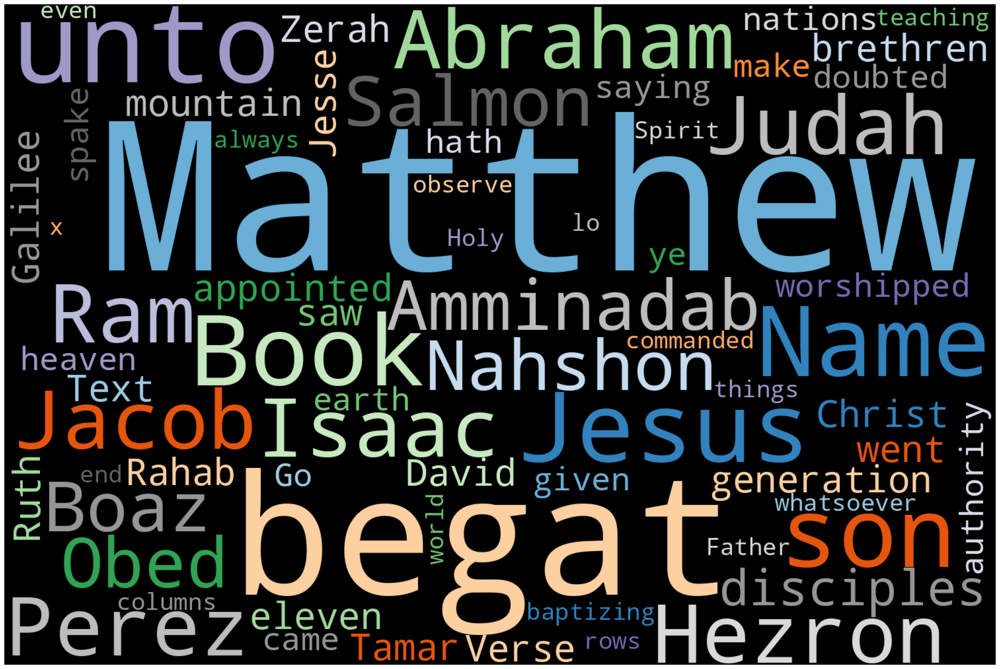

In [22]:
%time matthew_cloud = text_cloud(asv_matt)

## KJV Matthew

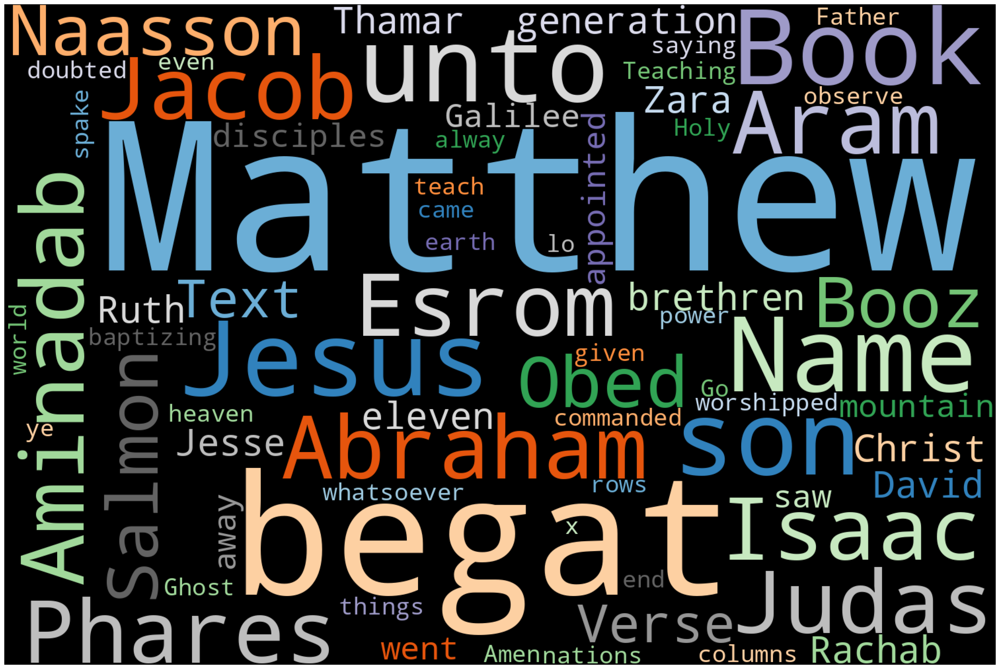

In [23]:
text_cloud(kjv_matt)

## ASV Mark

CPU times: user 1.42 s, sys: 36.1 ms, total: 1.46 s
Wall time: 1.47 s


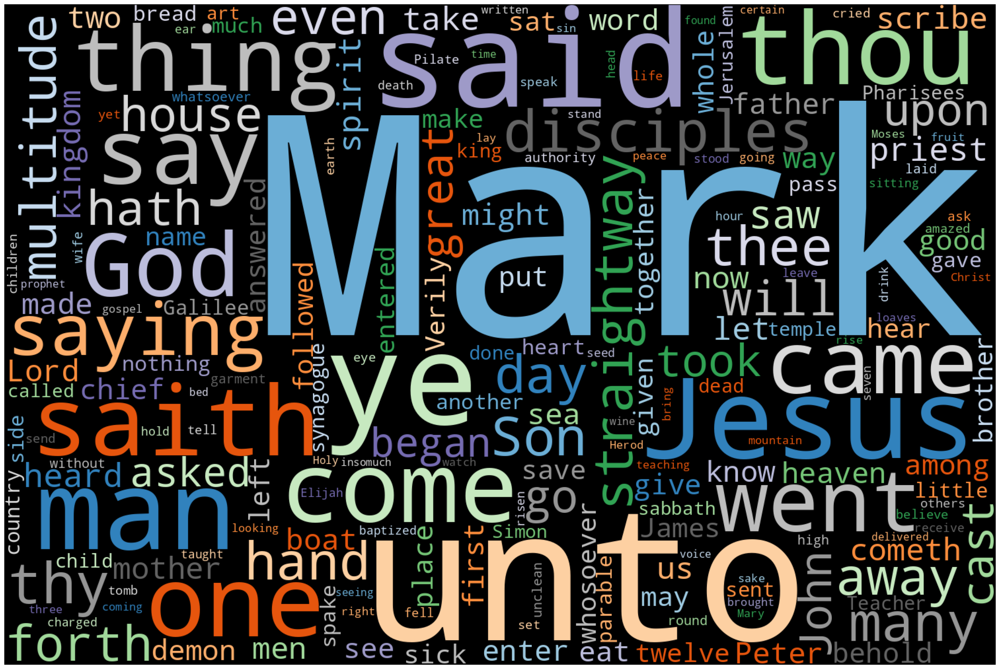

In [24]:
%time mark_cloud = text_cloud(asv_mark)

## KJV Mark

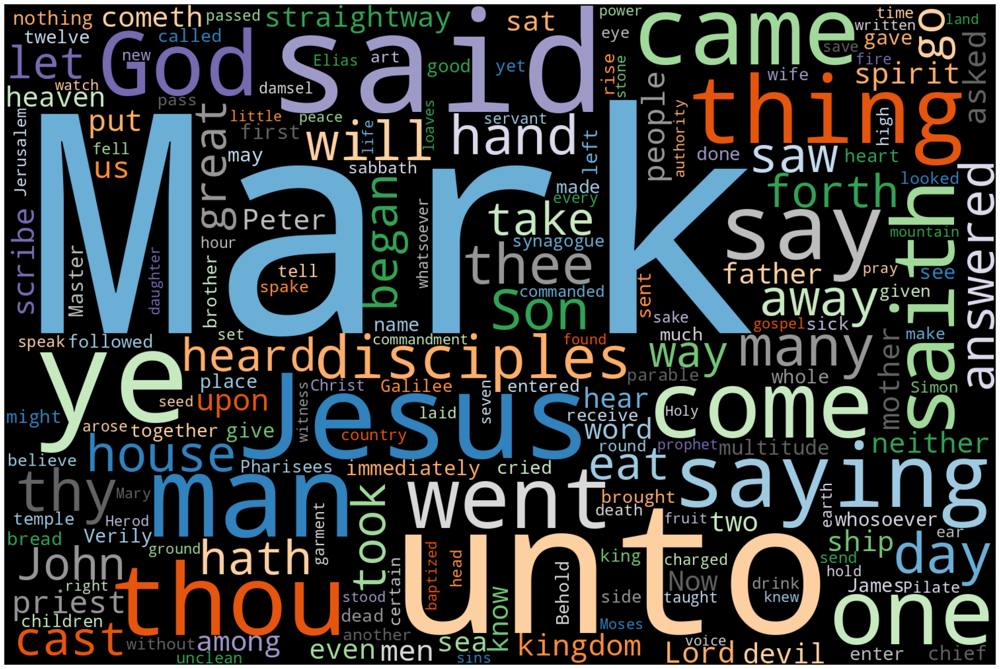

In [25]:
text_cloud(kjv_mark)

## ASV Luke

CPU times: user 866 ms, sys: 26 ms, total: 892 ms
Wall time: 896 ms


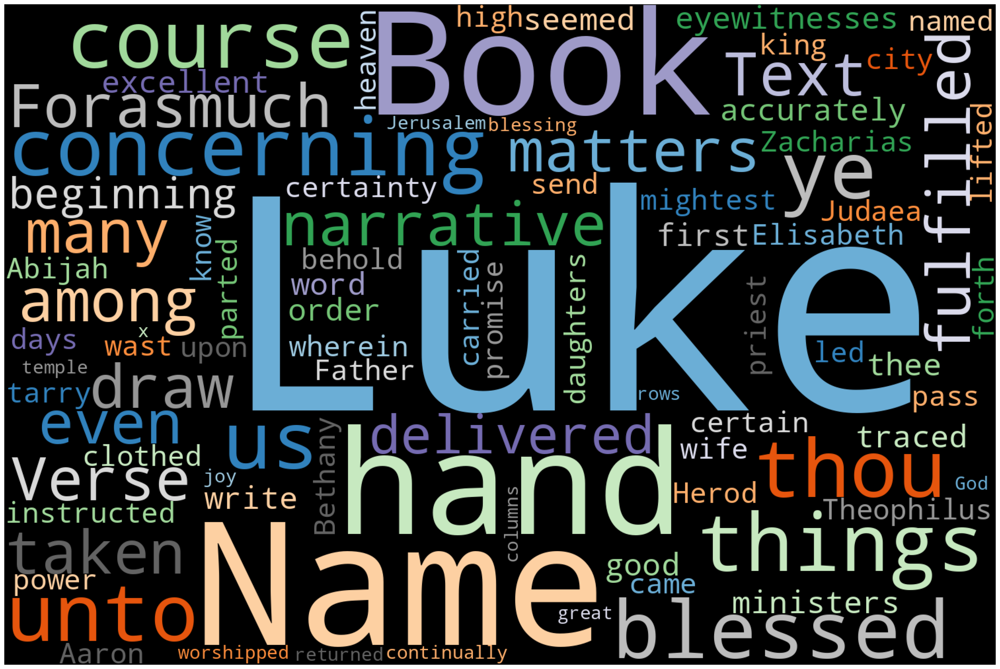

In [26]:
%time luke_cloud = text_cloud(asv_luke)

## KJV Luke

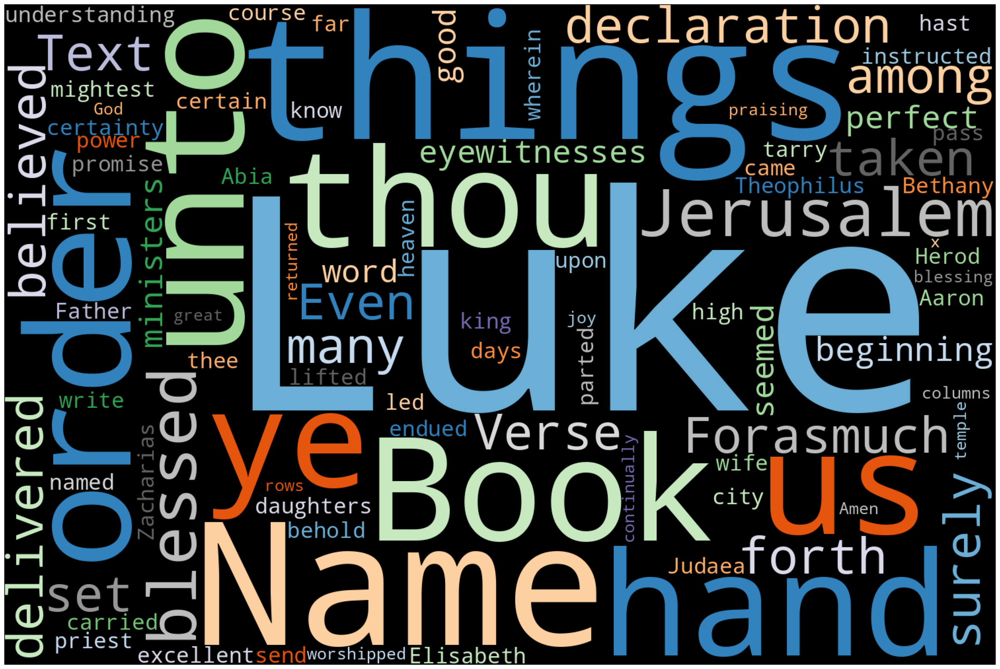

In [27]:
text_cloud(kjv_luke)

## ASV John

CPU times: user 1.59 s, sys: 40 ms, total: 1.63 s
Wall time: 1.65 s


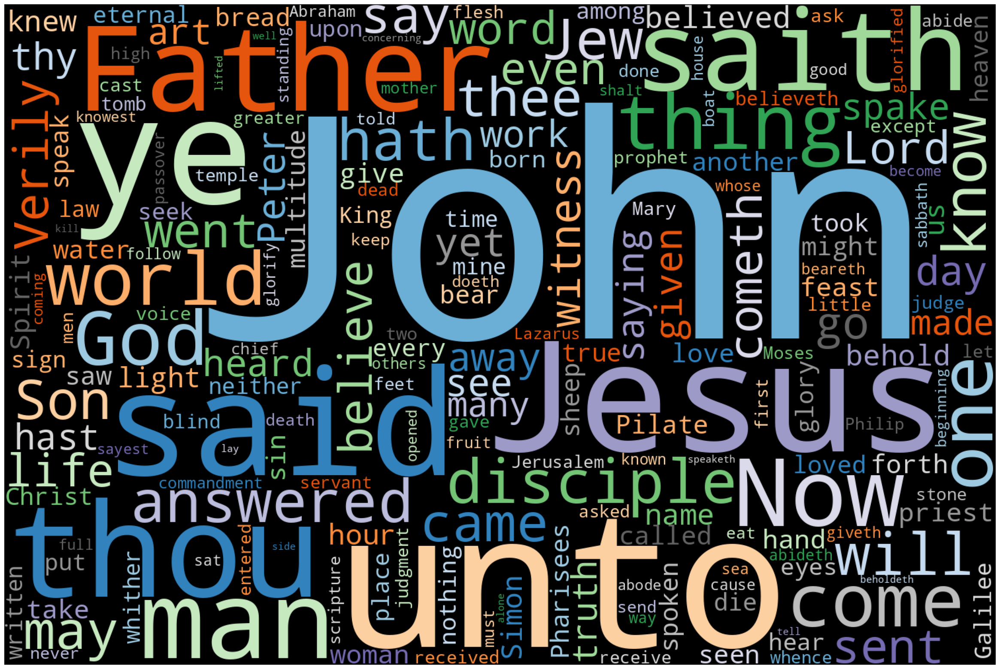

In [28]:
%time john_cloud = text_cloud(asv_john)

## KJV John

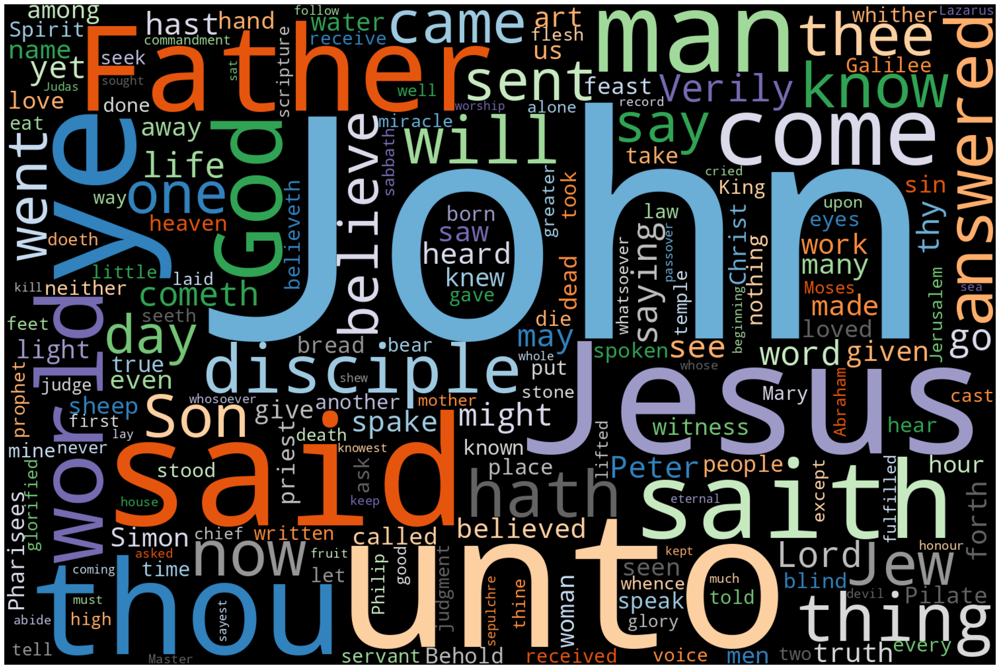

In [29]:
text_cloud(kjv_john)

## ASV Acts

CPU times: user 875 ms, sys: 24.9 ms, total: 900 ms
Wall time: 900 ms


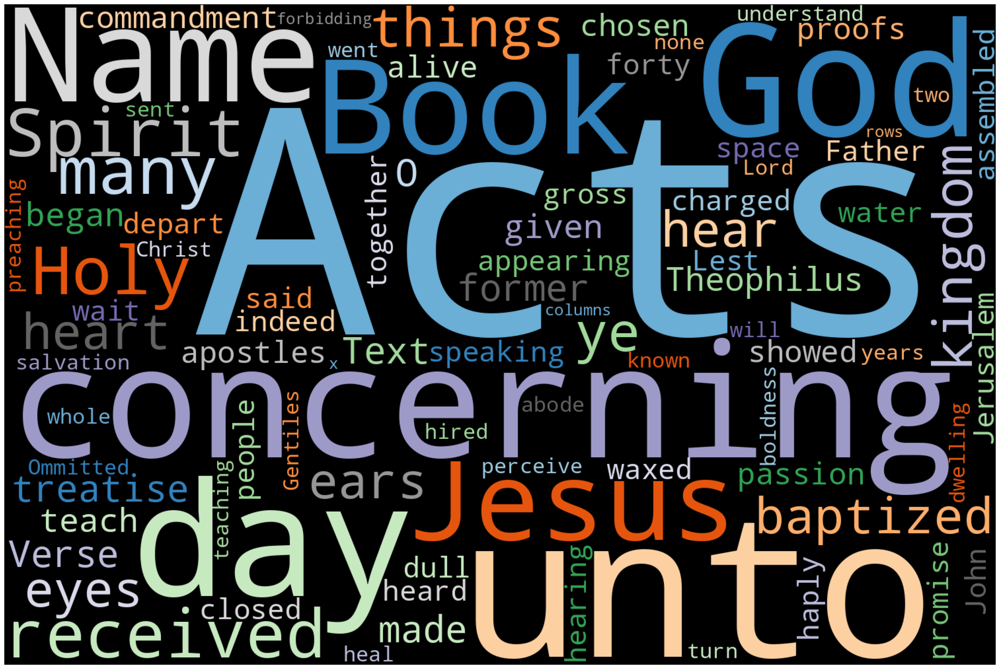

In [30]:
%time acts_cloud = text_cloud(asv_acts)

## KJV Acts

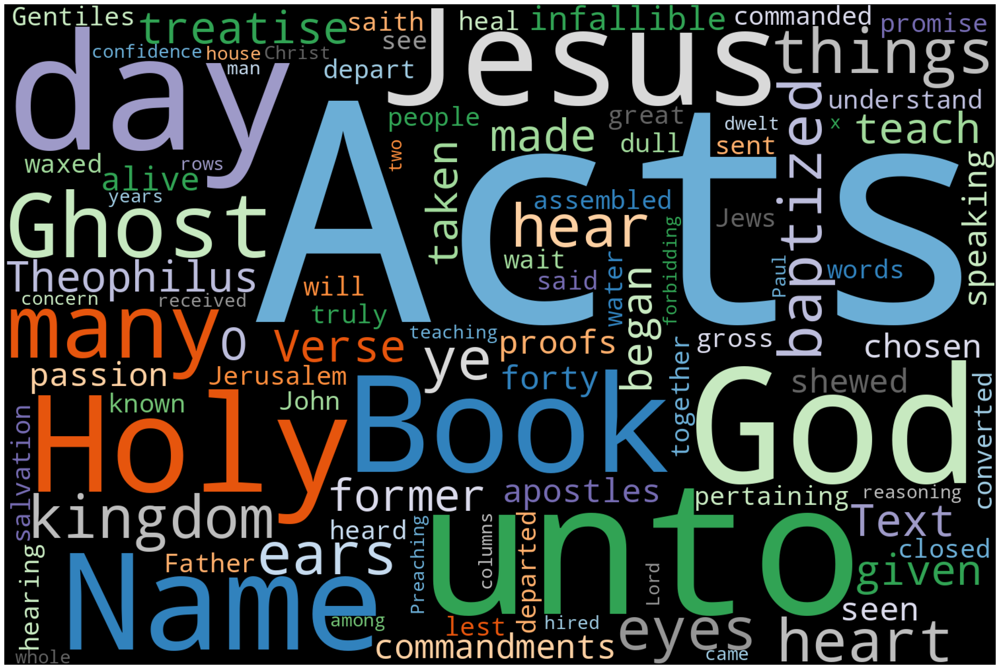

In [31]:
text_cloud(kjv_acts)

## ASV Romans

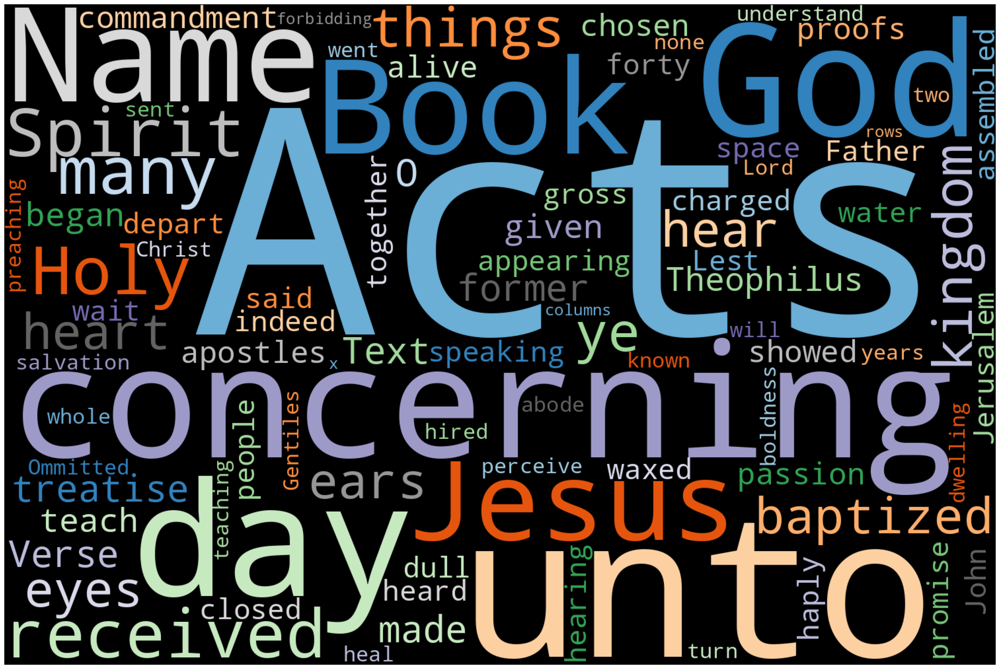

In [32]:
romans_cloud = text_cloud(asv_romans)

## KJV Romans

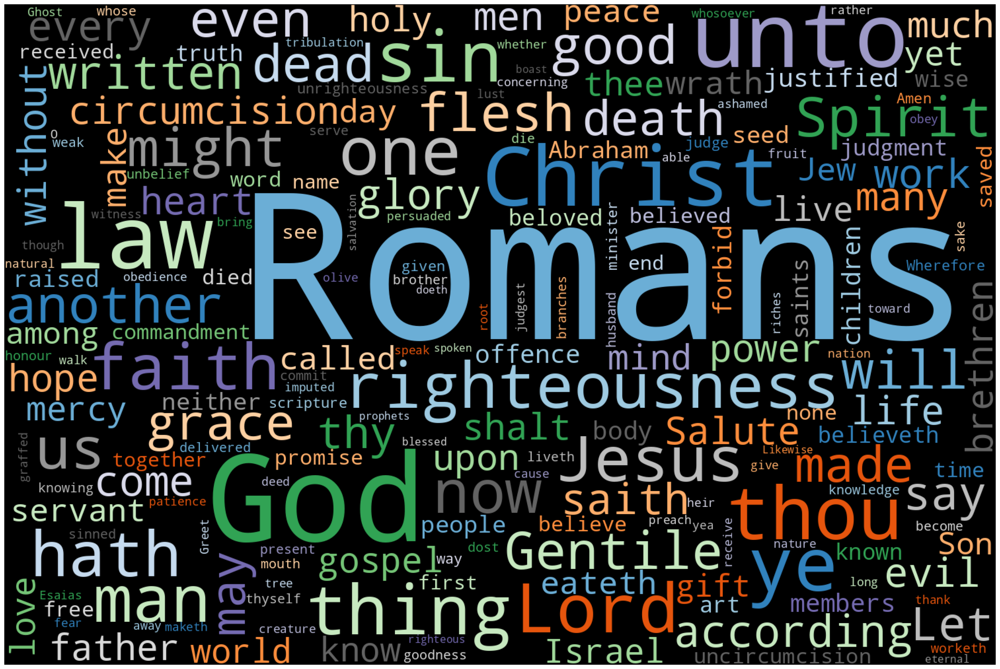

In [33]:
text_cloud(kjv_romans)

In [34]:
def count_verses_containing(df, s):
    return df[df.Text.str.contains(s, case=False, na=False)].shape[0]

In [35]:
asv_john.head(5)

,Verse,Text
Book Name,,
John,1:1,"In the beginning was the Word, and the Word was with God, and the Word was God."
John,1:2,The same was in the beginning with God.
John,1:3,All things were made through him; and without him was not anything made that hath been made.
John,1:4,In him was life; and the life was the light of men.
John,1:5,And the light shineth in the darkness; and the darkness apprehended it not.


# Emotions mentioned in the Bible

#### These are the ones we will check for(these can be adjusted as needed):
- happy
- sad
- angry
- upset
- sorrow
- tired 
- joy
- peace

In [36]:
gospels = {
    "matt": asv_matt,
    "mark": asv_mark,
    "luke": asv_luke,
    "john": asv_john,
    "acts": asv_acts,
    "romans": asv_romans
}

search_terms = ["happy", "sad", "angry", "upset", "tired", "sorrow", "joy", "peace"]


rows = [
[ book, term, count_verses_containing(verses, term) ] for (book, verses) in gospels.items()
for term in search_terms
] 
rows

[['matt', 'happy', 0],
 ['matt', 'sad', 9],
 ['matt', 'angry', 1],
 ['matt', 'upset', 0],
 ['matt', 'tired', 0],
 ['matt', 'sorrow', 4],
 ['matt', 'joy', 6],
 ['matt', 'peace', 5],
 ['mark', 'happy', 0],
 ['mark', 'sad', 1],
 ['mark', 'angry', 0],
 ['mark', 'upset', 0],
 ['mark', 'tired', 0],
 ['mark', 'sorrow', 3],
 ['mark', 'joy', 1],
 ['mark', 'peace', 8],
 ['luke', 'happy', 0],
 ['luke', 'sad', 2],
 ['luke', 'angry', 2],
 ['luke', 'upset', 0],
 ['luke', 'tired', 0],
 ['luke', 'sorrow', 3],
 ['luke', 'joy', 11],
 ['luke', 'peace', 19],
 ['john', 'happy', 0],
 ['john', 'sad', 0],
 ['john', 'angry', 0],
 ['john', 'upset', 0],
 ['john', 'tired', 0],
 ['john', 'sorrow', 4],
 ['john', 'joy', 7],
 ['john', 'peace', 5],
 ['acts', 'happy', 1],
 ['acts', 'sad', 5],
 ['acts', 'angry', 0],
 ['acts', 'upset', 0],
 ['acts', 'tired', 0],
 ['acts', 'sorrow', 1],
 ['acts', 'joy', 5],
 ['acts', 'peace', 10],
 ['romans', 'happy', 1],
 ['romans', 'sad', 5],
 ['romans', 'angry', 0],
 ['romans', 'upset'

In [37]:
search_term_counts = pd.DataFrame(data=rows, columns=['book', 'term', 'count'])
search_term_counts.head(10)

,book,term,count
0,matt,happy,0
1,matt,sad,9
2,matt,angry,1
3,matt,upset,0
4,matt,tired,0
5,matt,sorrow,4
6,matt,joy,6
7,matt,peace,5
8,mark,happy,0
9,mark,sad,1


In [38]:
fig = px.bar(search_term_counts, x="term", y="count" ,color="book", barmode="group", text_auto=True, height=800)
fig.show()

## This is the Bar chart of the emotions we checked for mentions of in the above listed books of the Bible.

# Plot of some time-related words
Next some words to do with timing and salvation we were curious about.

In [39]:
search_terms = ["beginning", "middle", "end", "death", "eternal", "salvation"]


rows = [
[ book, term, count_verses_containing(verses, term) ] for (book, verses) in gospels.items()
for term in search_terms
] 
rows

[['matt', 'beginning', 6],
 ['matt', 'middle', 0],
 ['matt', 'end', 47],
 ['matt', 'death', 11],
 ['matt', 'eternal', 5],
 ['matt', 'salvation', 0],
 ['mark', 'beginning', 4],
 ['mark', 'middle', 0],
 ['mark', 'end', 27],
 ['mark', 'death', 8],
 ['mark', 'eternal', 3],
 ['mark', 'salvation', 0],
 ['luke', 'beginning', 4],
 ['luke', 'middle', 0],
 ['luke', 'end', 42],
 ['luke', 'death', 11],
 ['luke', 'eternal', 4],
 ['luke', 'salvation', 6],
 ['john', 'beginning', 9],
 ['john', 'middle', 0],
 ['john', 'end', 30],
 ['john', 'death', 12],
 ['john', 'eternal', 17],
 ['john', 'salvation', 1],
 ['acts', 'beginning', 5],
 ['acts', 'middle', 0],
 ['acts', 'end', 38],
 ['acts', 'death', 11],
 ['acts', 'eternal', 2],
 ['acts', 'salvation', 5],
 ['romans', 'beginning', 5],
 ['romans', 'middle', 0],
 ['romans', 'end', 38],
 ['romans', 'death', 11],
 ['romans', 'eternal', 2],
 ['romans', 'salvation', 5]]

In [40]:
search_term_counts = pd.DataFrame(data=rows, columns=['book', 'term', 'count'])
search_term_counts.head(10)

,book,term,count
0,matt,beginning,6
1,matt,middle,0
2,matt,end,47
3,matt,death,11
4,matt,eternal,5
5,matt,salvation,0
6,mark,beginning,4
7,mark,middle,0
8,mark,end,27
9,mark,death,8


In [41]:
fig = px.bar(search_term_counts, x="term", y="count" ,color="book", barmode="group", text_auto=True, height=800)
fig.show()

# Jesus Vs Devil related words

#### We used this bar chart to compare words like Christ, angel or God versus sort of the opposite words, like devil and satan. We also threw in "man" and "woman" to see if one was mentioned more than the other.

In [42]:
search_terms = ["Jesus", "Christ", "angel", "satan", "devil", "demons", "God", "man", "woman"]


rows = [
[ book, term, count_verses_containing(verses, term) ] for (book, verses) in gospels.items()
for term in search_terms
] 


In [43]:
search_term_counts = pd.DataFrame(data=rows, columns=['book', 'term', 'count'])
search_term_counts.head(10)

,book,term,count
0,matt,Jesus,149
1,matt,Christ,17
2,matt,angel,19
3,matt,satan,3
4,matt,devil,6
5,matt,demons,11
6,matt,God,46
7,matt,man,184
8,matt,woman,10
9,mark,Jesus,81


In [44]:
fig = px.bar(search_term_counts, x="term", y="count" ,color="book", barmode="group", text_auto=True, height=800)
fig.show()

# Comparing New and Old Testaments of both Translations

In [45]:
asv_matt = asv_raw.loc["Matthew"]
asv_mark = asv_raw.loc["Mark"]
asv_luke = asv_raw.loc["Luke"]
asv_john = asv_raw.loc["John"]
asv_gen = asv_raw.loc["Genesis"]
asv_ex = asv_raw.loc["Exodus"]
asv_lev = asv_raw.loc["Leviticus"]
asv_num = asv_raw.loc["Numbers"]

In [46]:
kjv_matt = kjv_raw.loc["Matthew"]
kjv_mark = kjv_raw.loc["Mark"]
kjv_luke = kjv_raw.loc["Luke"]
kjv_john = kjv_raw.loc["John"]
kjv_gen = kjv_raw.loc["Genesis"]
kjv_ex = kjv_raw.loc["Exodus"]
kjv_lev = kjv_raw.loc["Leviticus"]
kjv_num = kjv_raw.loc["Numbers"]

In [47]:
compare= {
"Matt_kjv": kjv_matt,
"Matt_asv": asv_matt,
"Gen_kjv": kjv_gen,
"Gen_asv": asv_gen
}

In [48]:
search_terms=[' Jesus ', ' God ', ' love ',' sin ', ' child ',' blessed ']
old_timey_words=[' thou ', ' thy ', ' thine ', ' thee ', ' ye ', ' saith ', ' cometh ']

In [49]:
compareDF_old = [
[ book, term, count_verses_containing(verses, term) ]
for (book, verses) in compare.items()
for term in old_timey_words
]

In [50]:
compare_counts = pd.DataFrame(data=compareDF_old, columns=['Book', 'Old Timey Term', 'Count'])
compare_counts.head(10)

,Book,Old Timey Term,Count
0,Matt_kjv,thou,95
1,Matt_kjv,thy,60
2,Matt_kjv,thine,16
3,Matt_kjv,thee,43
4,Matt_kjv,ye,166
5,Matt_kjv,saith,42
6,Matt_kjv,cometh,14
7,Matt_asv,thou,103
8,Matt_asv,thy,63
9,Matt_asv,thine,14


In [51]:
compareASV= {
"Matt_asv": asv_matt,
"Mark_asv": asv_mark,
"Luke_asv": asv_luke,
"John_asv": asv_john,
"Gen_asv": asv_gen,
"Ex_asv": asv_ex,
"Lev_asv": asv_lev,
"Num_asv": asv_num
}

In [52]:
compareASV_old = [
[ book, term, count_verses_containing(verses, term) ]
for (book, verses) in compareASV.items()
for term in old_timey_words
]

In [53]:
compare_counts_ASV = pd.DataFrame(data=compareASV_old, columns=['Book', 'Old Timey Term', 'Count'])
compare_counts_ASV.head(10)

,Book,Old Timey Term,Count
0,Matt_asv,thou,103
1,Matt_asv,thy,63
2,Matt_asv,thine,14
3,Matt_asv,thee,38
4,Matt_asv,ye,170
5,Matt_asv,saith,49
6,Matt_asv,cometh,14
7,Mark_asv,thou,53
8,Mark_asv,thy,28
9,Mark_asv,thine,2


In [54]:
compare_plotASV=px.bar(compare_counts_ASV, x="Old Timey Term", y="Count", color="Book", barmode="group", text_auto=True, height=600, title="Old Word Counts ASV")
compare_plotASV

In [55]:
compareKJV= {
"Matt_kjv": kjv_matt,
"Mark_kjv": kjv_mark,
"Luke_kjv": kjv_luke,
"John_kjv": kjv_john,
"Gen_kjv": kjv_gen,
"Ex_kjv": kjv_ex,
"Lev_kjv": kjv_lev,
"Num_kjv": kjv_num
}

In [56]:
compareKJV_old = [
[ book, term, count_verses_containing(verses, term) ]
for (book, verses) in compareKJV.items()
for term in old_timey_words
]

In [57]:
compare_counts_KJV = pd.DataFrame(data=compareKJV_old, columns=['Book', 'Old Timey Term', 'Count'])
compare_counts_KJV.head(10)

,Book,Old Timey Term,Count
0,Matt_kjv,thou,95
1,Matt_kjv,thy,60
2,Matt_kjv,thine,16
3,Matt_kjv,thee,43
4,Matt_kjv,ye,166
5,Matt_kjv,saith,42
6,Matt_kjv,cometh,14
7,Mark_kjv,thou,46
8,Mark_kjv,thy,28
9,Mark_kjv,thine,4


In [58]:
compare_plotKJV=px.bar(compare_counts_KJV, x="Old Timey Term", y="Count", color="Book", barmode="group", text_auto=True, height=600, title="Old Word Counts KJV")
compare_plotKJV

In [59]:
compare_plot=px.bar(compare_counts, x="Old Timey Term", y="Count", color="Book", barmode="group", text_auto=True, height=600, title="Old Word Counts")
compare_plot